##Opencv İle Görüntü İşlemeye Giriş

In [ ]:
import cv2
import time
import numpy as np

##Resmi İçeri Aktarma (Open Image)

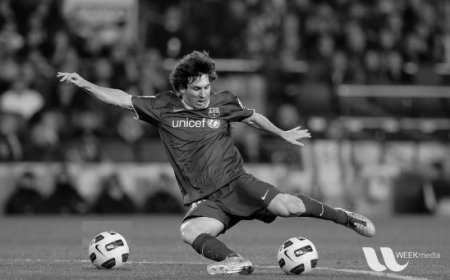

In [ ]:
# İçe Aktarma
img = cv2.imread("messi5.jpg",0) # 0 gray scaler olarak ayarlamamızı sağlar.

# Görselleştirme
from google.colab.patches import cv2_imshow
cv2_imshow(img)


In [ ]:
k = cv2.waitKey(0) &0xFF # klavyeye bağlanma işlemi
if k == 27: # esc tuşuna karşılık gelir
  cv2.destroyAllWindows # bütün pencereleri kapama
elif k == ord('s'): # s tuşu
  cv2.imwrite("messi_gray.png",img)

##Video İçeri Aktarma (Video Play)


In [ ]:
video_name = "MOT17-04-DPM.mp4"

# video içeri aktarma : capture(cap)
cap = cv2.VideoCapture(video_name)
print("Genislik:" , cap.get(3)) # 3. indeksinde "video genişliği elde ederiz"
print("Yükseklik:" , cap.get(4)) # 4. indeksinde "video yüksekliği elde ederiz"

Genislik: 1920.0
Yükseklik: 1080.0


In [ ]:
# Aktarılan videonun dogru bir sekilde aktarıldıgını test etme.
if cap.isOpened() == False:
  print("Hata")

while True:
  ret, frame = cap.read()

  if ret == True:
    time.sleep(0.01) # kullanmazsak çok hızlı bir şekilde akar
    cv2_imshow(frame)
  else:
    break # burda videoda gösterilecek bir şey kalmamıştır

  if cv2.waitKey(1) & 0xFF == ord("q"):
    break # burda ise videodan kendi isteğimle çıkmışımdır

  cap.release() # stop capture
  cv2.destroyAllWindows()

##Kamera Açma Ve Video Kaydı ( Video&Camera)

In [ ]:
# Kamera yakalaması
cap = cv2.VideoCapture(0)  # 0, default kamera için

# Çerçeve genişliği ve yüksekliği
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print("Frame Width:", width, "Height:", height)

# Video kaydedici
writer = cv2.VideoWriter("video_kaydi.mp4", cv2.VideoWriter_fourcc(*"DIVX"), 20, (width, height))

while True:
    # Kameradan çerçeve al
    ret, frame = cap.read()

    # Çerçeve göster
    cv2.imshow("Video", frame)

    # Video kaydet
    writer.write(frame)

    # Çıkış için "q" tuşuna basılmasını kontrol et
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

# Kaynakları serbest bırak
cap.release()
writer.release()
cv2.destroyAllWindows()


##Yeniden Boyutlandırma Ve Kırpma (Resize&Crop)

Resim boyutu: (512, 512, 3)


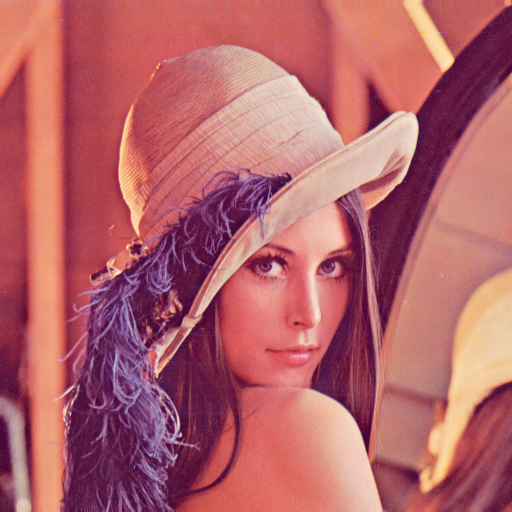

In [ ]:
from google.colab.patches import cv2_imshow

img = cv2.imread("/Lenna_(test_image).png",1) # 0(siyah beyaz) 1 ise renkli
print("Resim boyutu:", img.shape)
cv2_imshow(img)


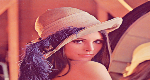

In [ ]:
# resized
imgResized = cv2.resize(img, (150,80))
cv2_imshow(imgResized)

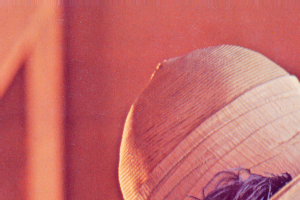

In [ ]:
# kırpma işlemi
imgCropped = img[:200,0:300]
cv2_imshow(imgCropped)

##Şekiller Ve Metin (Shape Text)

(512, 512, 3)


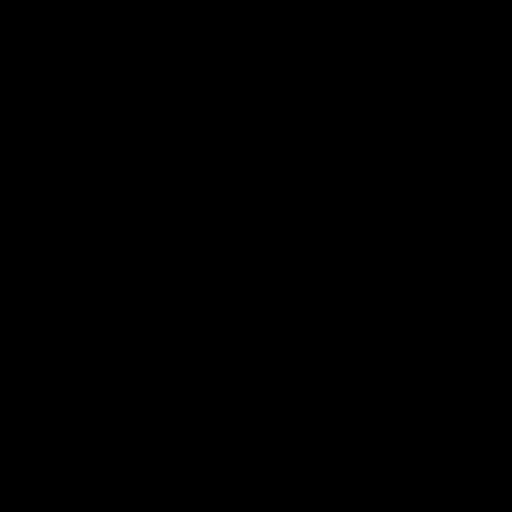

In [ ]:
# Resim oluşturma
img = np.zeros((512,512,3),np.uint8) # siyah bir resim
print(img.shape)

cv2_imshow(img)

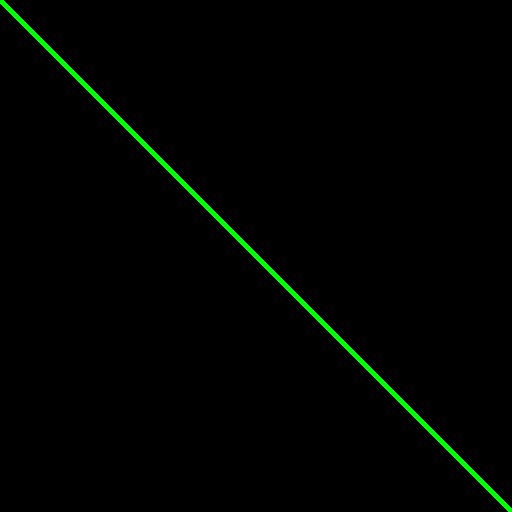

In [ ]:
# çizgi
# (resim, başlangıç noktası, bitiş noktası, renk, çizgi kalınlığı)
cv2.line( img, (0,0), (512,512), (0,255,0), 3)  # BGR = (255,0,0) Opencvde böyle
cv2_imshow(img)

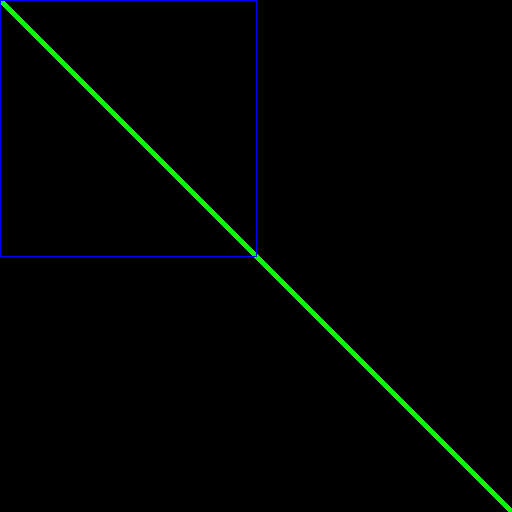

In [ ]:
# dikdörtgen
# (resim, baslangıc, bitis , renk, (doldurma işlemi))
cv2.rectangle(img, (0,0), (256,256), (255,0,0)) # cv2.FILLED yazarsak içini doldurur
cv2_imshow(img)

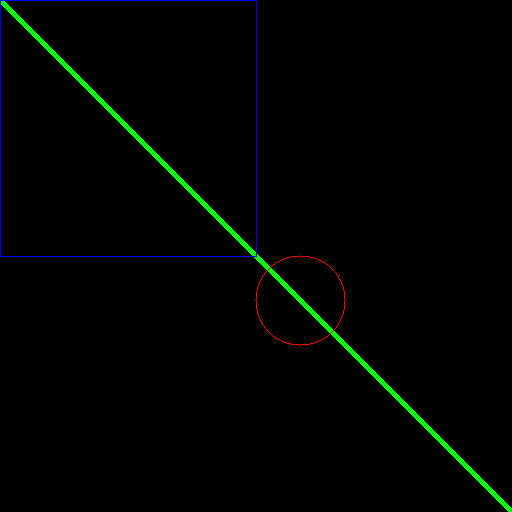

In [ ]:
# çember
# (resim, merkez, yarıcap, renk)
cv2.circle(img, (300,300), 45, (0,0,255))
cv2_imshow(img)

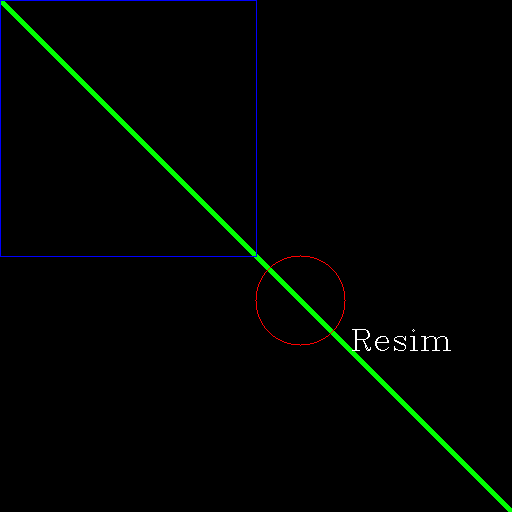

In [ ]:
# metin
# (resim , baslangıc noktası, font , kalınlıgı, renk)
cv2.putText(img, "Resim", (350,350), cv2.FONT_HERSHEY_COMPLEX,1,(255,255,255))
cv2_imshow(img)

## Görüntülerin Birleştirilmesi( Joining Images)

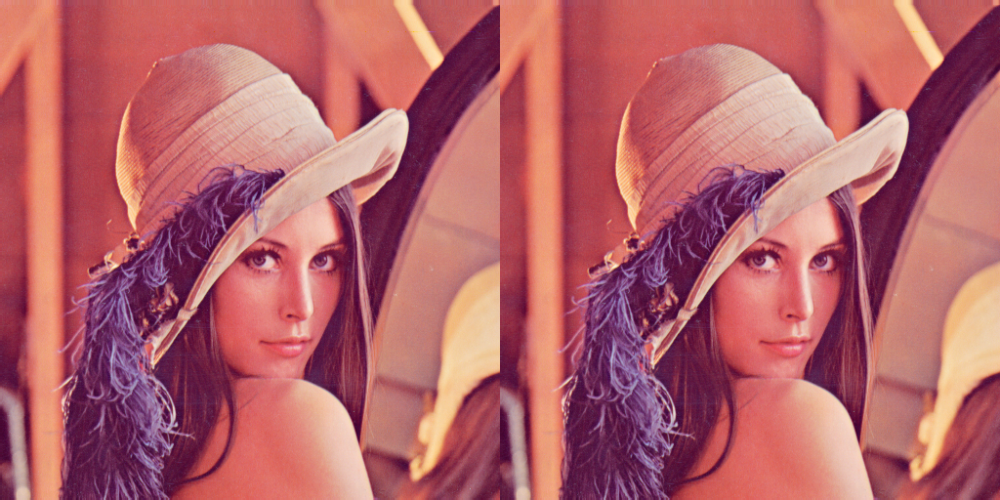

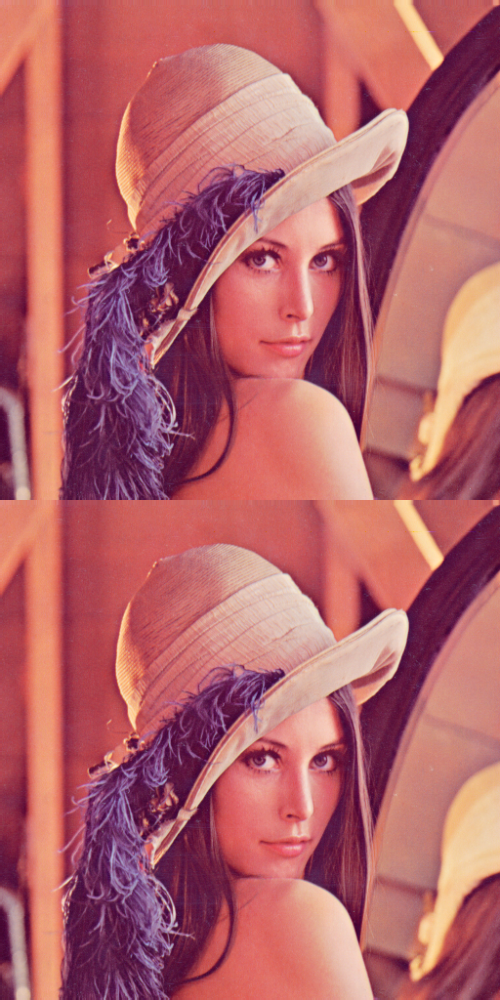

In [ ]:
# resmi içe aktarma
img = cv2.imread("/Lenna_(test_image).png")
#cv2_imshow(img)

# yatay
hor = np.hstack((img,img))
cv2_imshow(hor)

# dikey
ver = np.vstack((img,img))
cv2_imshow(ver)

## Persfektif Çalışma ( Warp Perspective)

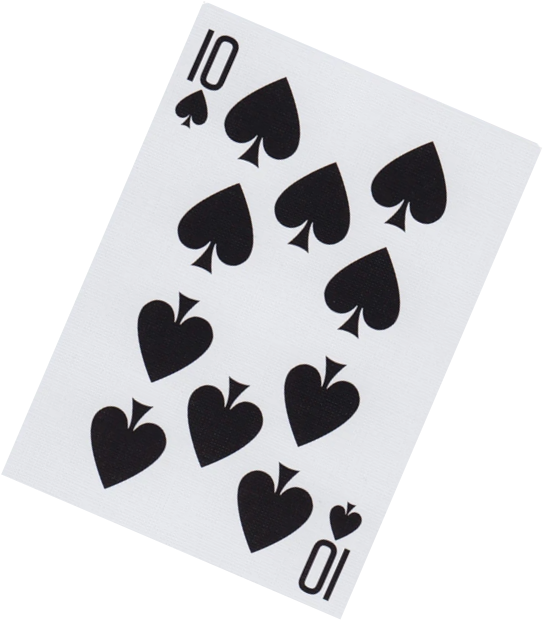

In [ ]:
# resmi içe aktar
img = cv2.imread("/kart.png")
cv2_imshow(img)


[[ 9.88318421e-01  4.80519997e-01 -2.27793757e+02]
 [-4.28952606e-01  8.92451730e-01  9.77666476e+01]
 [-1.23898125e-04  7.89697479e-05  1.00000000e+00]]


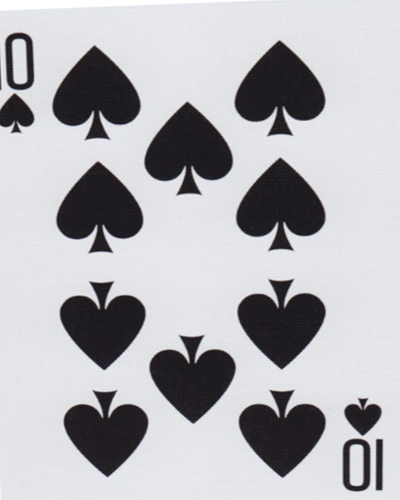

In [ ]:
width = 400
height = 500

# çevirmek istediğim resmin 4 köşesi
pts1 = np.float32([[230,1],[1,472],[540,150],[338,617]])

# düzleştirmek istediğim resmin köşeleri
pts2 = np.float32([[0,0], [0,height],[width,0],[width,height]])

matrix = cv2.getPerspectiveTransform(pts1,pts2)
print(matrix) # transformu gerçekleştirmek için

imgOutput = cv2.warpPerspective(img, matrix , (width,height))
cv2_imshow(imgOutput)

## Görüntüleri Karıştırmak

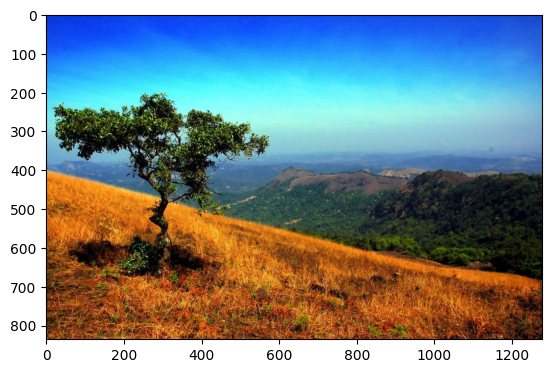

In [ ]:
import matplotlib.pyplot as plt

# karıştırma (opencv'ye fotoğraf yüklerken RGR olarak yüklenir ama biz RGB ile çalışırız)
img1 = cv2.imread("/img1.JPG")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("/indir.jpg")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

plt.figure()
plt.imshow(img1)

(600, 600, 3)
(600, 600, 3)
(600, 600, 3)
(600, 600, 3)


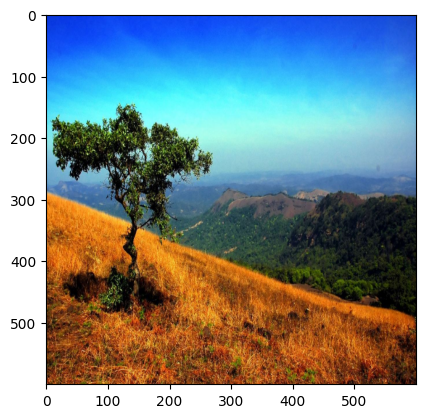

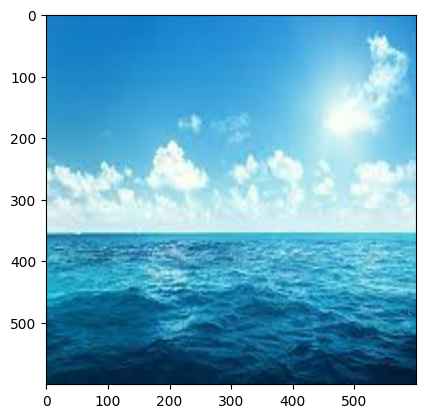

In [ ]:
# görüntü boyutları
print(img1.shape)
print(img2.shape)

# boyutları aynı yapıcaz ki birleştirirken sorun çıkmasın
img1 = cv2.resize(img1,(600,600))
print(img1.shape)

img2 = cv2.resize(img2,(600,600))
print(img2.shape)

plt.figure()
plt.imshow(img1)
plt.figure()
plt.imshow(img2)

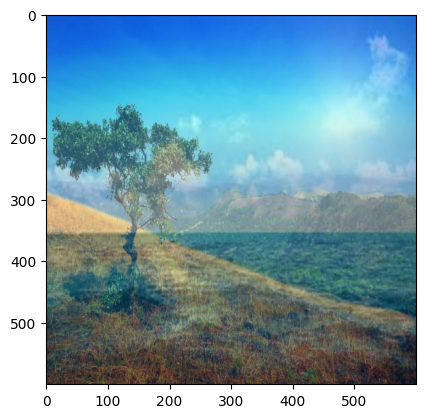

In [ ]:
# karıştırılmış resim denklemi = alpha*img1 + beta*img2
blended = cv2.addWeighted(src1 = img1, alpha = 0.5 , src2= img2, beta = 0.5, gamma = 0 )
plt.figure()
plt.imshow(blended)

## Görüntü Eşikleme ( Blending)

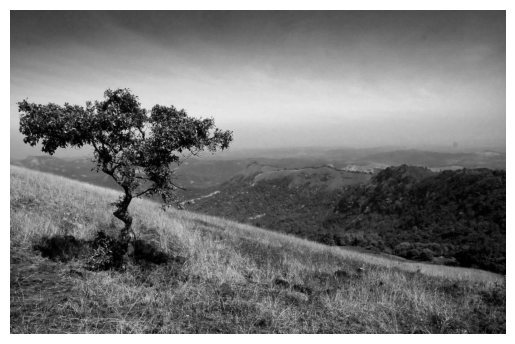

In [ ]:
import matplotlib.pyplot as plt

# resmi içe aktar
# koyu renkli yerler : 0'a yakın yerler, açık renkli renkler: 255' e yakın
img = cv2.imread("/content/img1.JPG")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure()
plt.imshow(img, cmap = "gray") # color map gray = siyah-beyaz 0-255
plt.axis("off") #eksenleri kapat
plt.show()

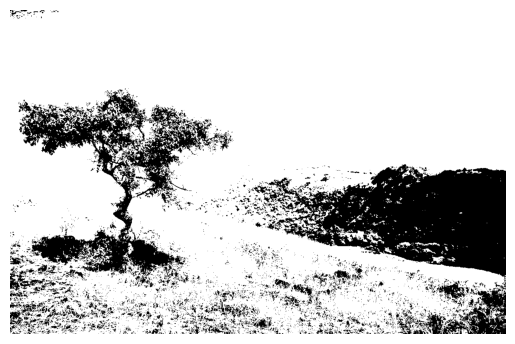

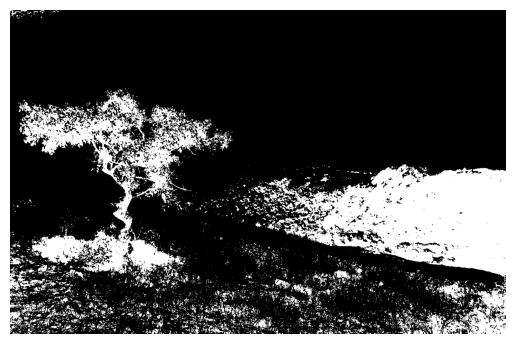

In [ ]:
# EŞİKLEME
_ , tresh_img = cv2.threshold(img, thresh = 60 ,maxval = 255, type = cv2.THRESH_BINARY)
plt.figure()
plt.imshow(tresh_img, cmap= "gray")
plt.axis("off")
plt.show()
# piksel değeri 60'tan büyükse beyaz, küçükse siyah yapar.

_ , tresh_img = cv2.threshold(img, thresh = 60 ,maxval = 255, type = cv2.THRESH_BINARY_INV)
plt.figure()
plt.imshow(tresh_img, cmap= "gray")
plt.axis("off")
plt.show()
# pikselin genlikleri 60 kücük olan yerleri siyah yap (her birine 0 degerini ata)

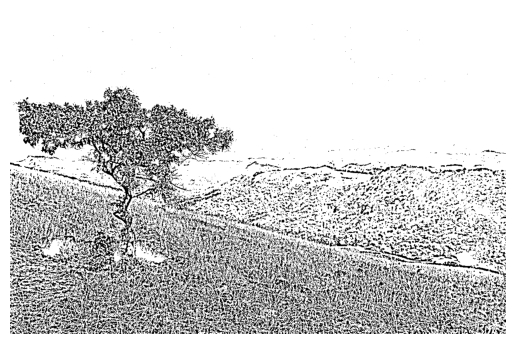

In [ ]:
# Yuvarlamalı eşik değeri (resim, max value, kullanacağımız yöntem, eşikleme türü, blocksize, C)
thresh_img2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 8)

plt.figure()
plt.imshow(thresh_img2, cmap="gray")
plt.axis("off")  # Eksenleri kapat
plt.show()


## Bulanıklaştırma(blurring,smoothing)

#### 3 Ana Bulanıklaştırma Tekniği vardır
* Ortalama Bulanıklaştırma
* Gauss Bulanıklaştırma
* Medyan Bulanıklaştırma

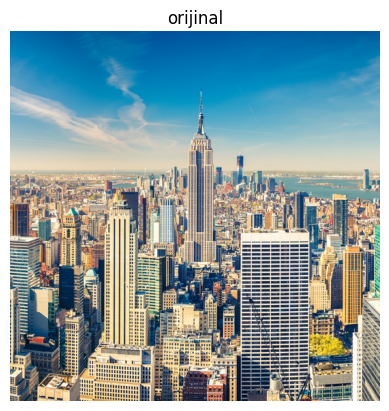

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 542.5, 542.5, -0.5),
 Text(0.5, 1.0, 'orijinal'),
 None)

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import warnings

warnings.filterwarnings("ignore")

# blurring (detayı azaltır, gürültüyü engeller)
img = cv2.imread("/content/NYC.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(),plt.imshow(img),plt.axis("off"),plt.title("orijinal"),plt.show()

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 542.5, 542.5, -0.5),
 Text(0.5, 1.0, 'Ortalama Bulanıklaştırma'))

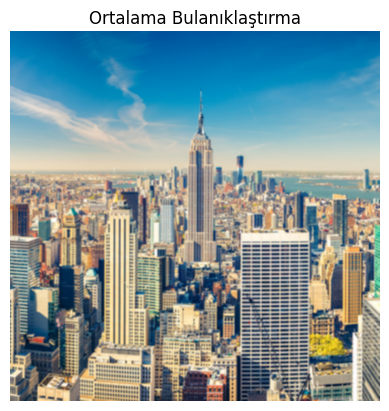

In [ ]:
"""
Ortalama Bulanıklaştırma Yöntemi
"""
dst2 = cv2.blur(img, ksize = (3,3)) # dst = çıktı demek
plt.figure(),plt.imshow(dst2),plt.axis("off"),plt.title("Ortalama Bulanıklaştırma")

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 542.5, 542.5, -0.5),
 Text(0.5, 1.0, 'Gauss Blur'))

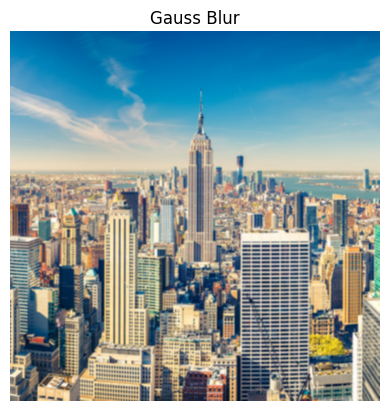

In [ ]:
"""
Gauss Bulanıklaştırma Yöntemi (gaussian blur)
"""
gb = cv2.GaussianBlur(img,ksize=(3,3),sigmaX=7) # y yönündeki sigmayı yazmazsak otomatik olarak x yönündekine eşit olur
plt.figure(),plt.imshow(gb),plt.axis("off"),plt.title("Gauss Blur")

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 542.5, 542.5, -0.5),
 Text(0.5, 1.0, 'Medyan Blur'))

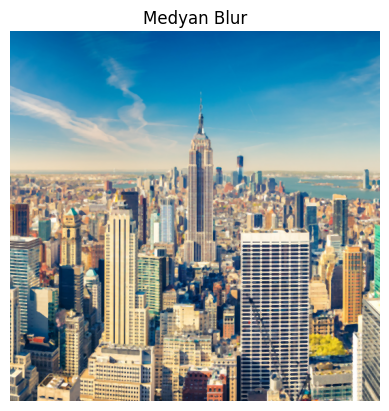

In [ ]:
"""
Medyan Bulanıklaştırma Yöntemi
"""
mb = cv2.medianBlur(img,ksize=3)
plt.figure(),plt.imshow(mb),plt.axis("off"),plt.title("Medyan Blur")

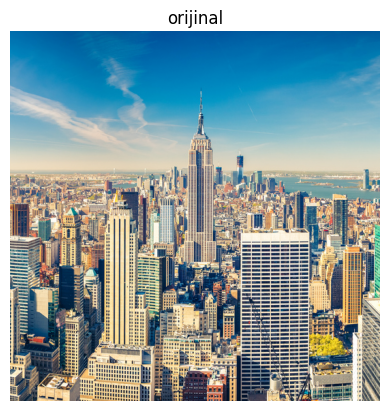

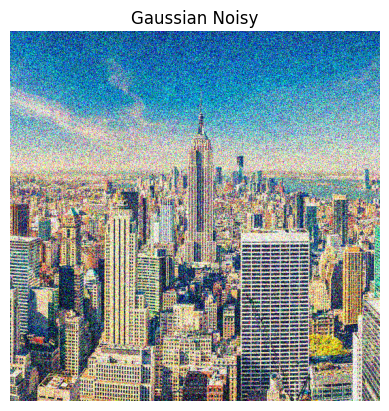

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 542.5, 542.5, -0.5),
 Text(0.5, 1.0, 'Gaussian Noisy'),
 None)

In [ ]:
def gaussianNoise(image):
  row, col, ch = image.shape
  mean = 0 # ortalama
  var = 0.05 # varyans
  sigma = var**0.5

  gauss = np.random.normal(mean, sigma,(row,col,ch))
  gauss = gauss.reshape(row,col,ch)
  noisy = image + gauss

  return noisy

# içe aktar ve normalize et
img = cv2.imread("/content/NYC.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)/255
plt.figure(),plt.imshow(img),plt.axis("off"),plt.title("orijinal"),plt.show()

gaussianNoisyImage = gaussianNoise(img)
plt.figure(),plt.imshow(gaussianNoisyImage),plt.axis("off"),plt.title("Gaussian Noisy"),plt.show()

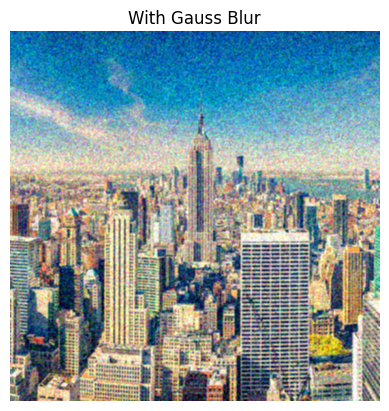

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 542.5, 542.5, -0.5),
 Text(0.5, 1.0, 'With Gauss Blur'),
 None)

In [ ]:
# gauss blur
gb2 = cv2.GaussianBlur(gaussianNoisyImage, ksize= (3,3), sigmaX=7)
plt.figure(),plt.imshow(gb2),plt.axis("off"),plt.title("With Gauss Blur"),plt.show()

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 542.5, 542.5, -0.5),
 Text(0.5, 1.0, 'With Medyan Blur'))

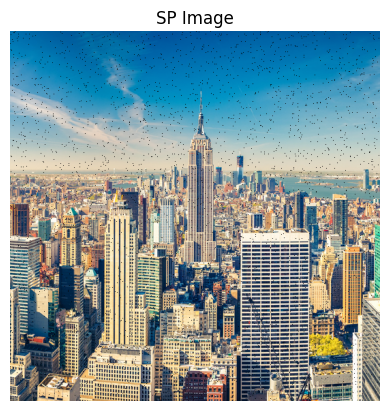

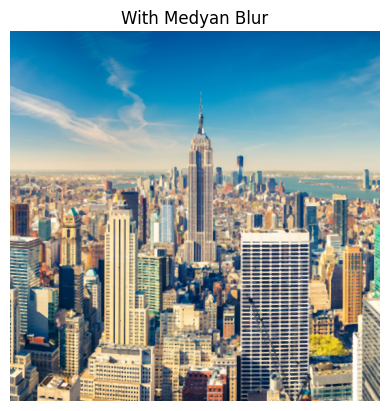

In [ ]:
def saltPepperNoise(image):
    row, col, ch = image.shape
    s_vs_p = 0.5
    amount = 0.004

    noisy = np.copy(image)

    # salt = white
    num_salt = np.ceil(amount * image.size * s_vs_p)
    salt_coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy[salt_coords[0], salt_coords[1], :] = 1

    # pepper = black
    num_pepper = np.ceil(amount * image.size * (1 - s_vs_p))
    pepper_coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy[pepper_coords[0], pepper_coords[1], :] = 0

    return noisy

spImage = saltPepperNoise(img)
plt.figure(), plt.imshow(spImage), plt.axis("off"), plt.title("SP Image")


mb2 = cv2.medianBlur(spImage,ksize=3)
plt.figure(),plt.imshow(mb2),plt.axis("off"),plt.title("With Medyan Blur")

## Morfolojik Operasyonlar (Morphological)
* Erozyon
* Genişleme
* Açılma
* Kapama
* Gradyan


(<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, *, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>,
 (-0.5, 499.5, 533.5, -0.5),
 Text(0.5, 1.0, 'Original Image'))

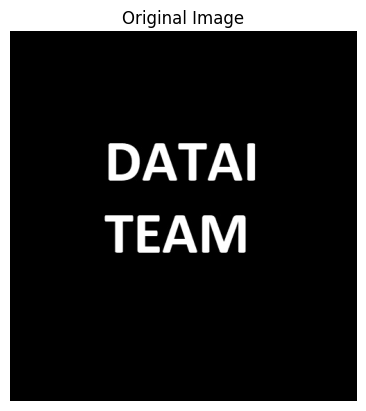

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# resmi içe aktar
img = cv2.imread("/content/datai_team.jpg",0)
plt.figure,plt.imshow(img,cmap="gray"),plt.axis("off"),plt.title("Original Image")


(<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, *, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>,
 (-0.5, 499.5, 533.5, -0.5),
 Text(0.5, 1.0, 'Erozyon Image'))

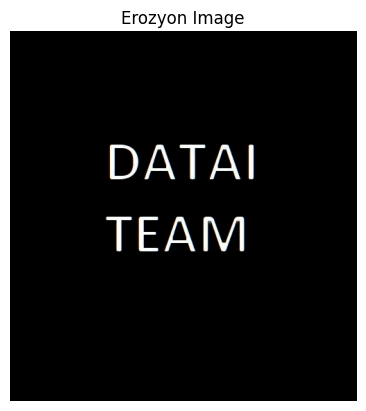

In [ ]:
# Erozyon = Sınır Küçültme, Daralma
kernel = np.ones((5,5),dtype= np.uint8)
result = cv2.erode(img, kernel, iterations = 1)
plt.figure,plt.imshow(result,cmap="gray"),plt.axis("off"),plt.title("Erozyon Image")

(<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, *, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>,
 (-0.5, 499.5, 533.5, -0.5),
 Text(0.5, 1.0, 'Erozyon Image'))

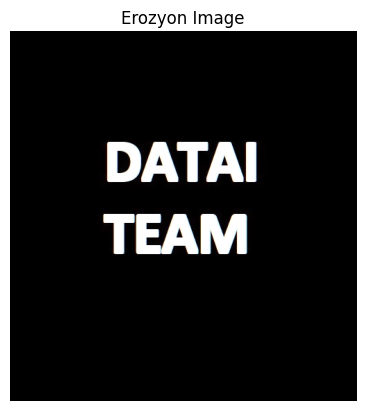

In [ ]:
# genişleme(dilation) = erozyonun tersi, görüntüdeki beyaz bölgeyi arttırır
result2 = cv2.dilate(img, kernel, iterations=1)
plt.figure,plt.imshow(result2,cmap="gray"),plt.axis("off"),plt.title("Erozyon Image")

(<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, *, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>,
 (-0.5, 499.5, 533.5, -0.5),
 Text(0.5, 1.0, 'Img With White Noise'))

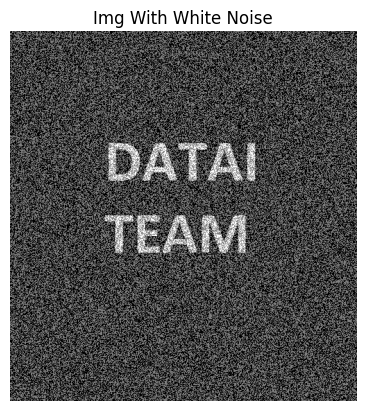

In [ ]:
# Açılma Yöntemi = Gürültüyü azaltmak için kullanılır, erezyon+genişlemedir
# ilk önce white gürültü oluşturuyoruz
whiteNoise = np.random.randint(0,2, size=img.shape[:2])
whiteNoise = whiteNoise*255
plt.figure,plt.imshow(whiteNoise,cmap="gray"),plt.axis("off"),plt.title("White Noise")

noise_img = whiteNoise + img
plt.figure,plt.imshow(noise_img,cmap="gray"),plt.axis("off"),plt.title("Img With White Noise")


(<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, *, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>,
 (-0.5, 499.5, 533.5, -0.5),
 Text(0.5, 1.0, 'Acilma'))

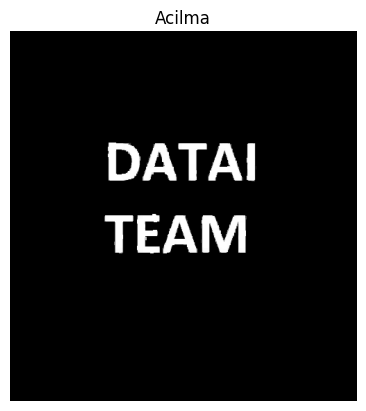

In [ ]:
opening = cv2.morphologyEx(noise_img.astype(np.float32),cv2.MORPH_OPEN,kernel)
plt.figure,plt.imshow(opening,cmap="gray"),plt.axis("off"),plt.title("Acilma")

(<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, *, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>,
 (-0.5, 499.5, 533.5, -0.5),
 Text(0.5, 1.0, 'Black Noise'))

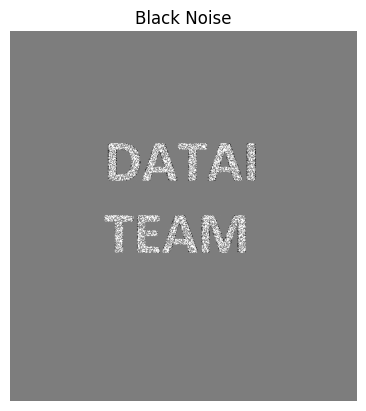

In [ ]:
# Kapatma = acilmanin tersi , genişleme+erozyon
# black noise
blackNoise = np.random.randint(0,2, size=img.shape[:2])
blackNoise = blackNoise*-255
plt.figure,plt.imshow(blackNoise,cmap="gray"),plt.axis("off"),plt.title("Black Noise")

black_noise_img = blackNoise + img
black_noise_img[black_noise_img <= -245] = 0
plt.figure,plt.imshow(black_noise_img,cmap="gray"),plt.axis("off"),plt.title("Black Noise")

(<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, *, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>,
 (-0.5, 499.5, 533.5, -0.5),
 Text(0.5, 1.0, 'Kapama'))

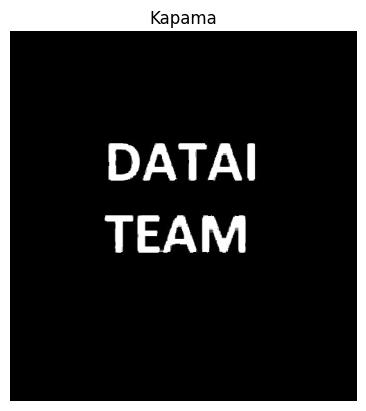

In [ ]:
closing = cv2.morphologyEx(noise_img.astype(np.float32),cv2.MORPH_CLOSE,kernel)
plt.figure,plt.imshow(closing,cmap="gray"),plt.axis("off"),plt.title("Kapama")

(<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, *, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>,
 (-0.5, 499.5, 533.5, -0.5),
 Text(0.5, 1.0, 'Gradient'))

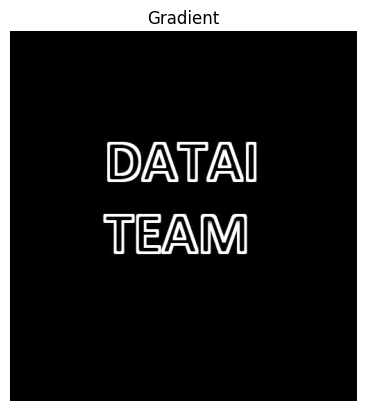

In [ ]:
# gradient = kenar tespiti, görüntünün genişlemesi - erozyonu
gradient = cv2.morphologyEx(img,cv2.MORPH_GRADIENT,kernel)
plt.figure,plt.imshow(gradient,cmap="gray"),plt.axis("off"),plt.title("Gradient")

# Gradyanlar(Gradients)

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 315.5, 293.5, -0.5),
 Text(0.5, 1.0, 'Laplacian'))

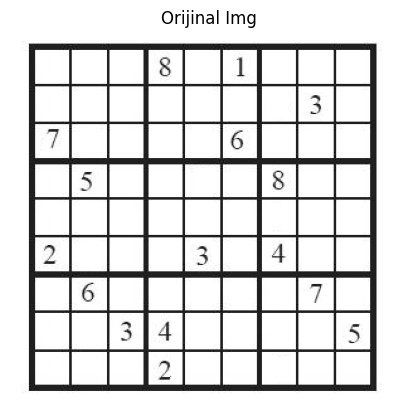

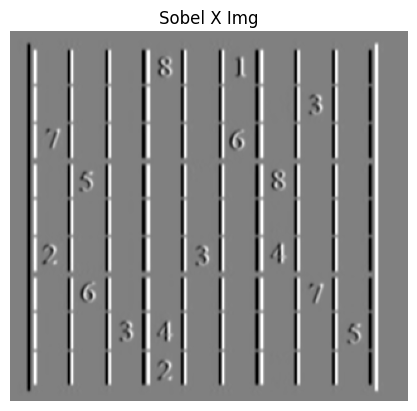

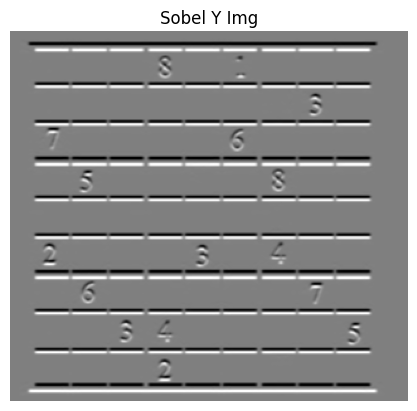

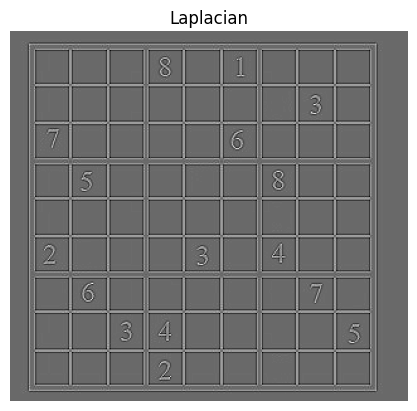

In [23]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# resmi içe aktar
img = cv2.imread("/content/sudoku.jpg",0)
plt.figure(),plt.imshow(img, cmap= "gray"), plt.axis("off"), plt.title("Orijinal Img")

# x gradyan
sobelx = cv2.Sobel(img, ddepth = cv2.CV_16S, dx = 1, dy = 0, ksize = 5)
plt.figure(),plt.imshow(sobelx, cmap= "gray"), plt.axis("off"), plt.title("Sobel X Img")

# y gradyan
sobely = cv2.Sobel(img, ddepth = cv2.CV_16S, dx = 0, dy = 1, ksize = 5)
plt.figure(),plt.imshow(sobely, cmap= "gray"), plt.axis("off"), plt.title("Sobel Y Img")

# laplacian gradyan
laplacian = cv2.Laplacian(img, ddepth = cv2.CV_16S)
plt.figure(),plt.imshow(laplacian,cmap = "gray"),plt.axis("off"),plt.title("Laplacian")

# Histogram
* Ton dağılımının grafiksel bir temsili olarak işlev görür.
* Her bir ton değeri için piksel sayısını içerir
* Belirli bir görüntü için histograma bakılarak,ton dağılımı anlaşılabilir


(371, 366, 3)


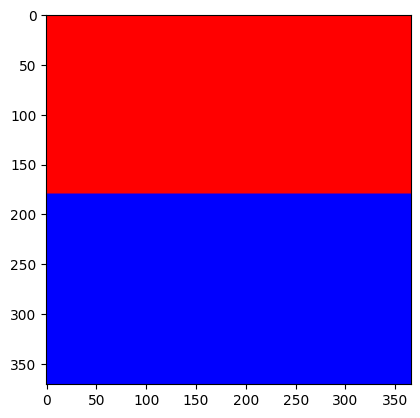

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# resmi içe aktar
img = cv2.imread("/content/red_blue.jpg")
img_vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(),plt.imshow(img_vis)
print(img.shape)

(256, 1)


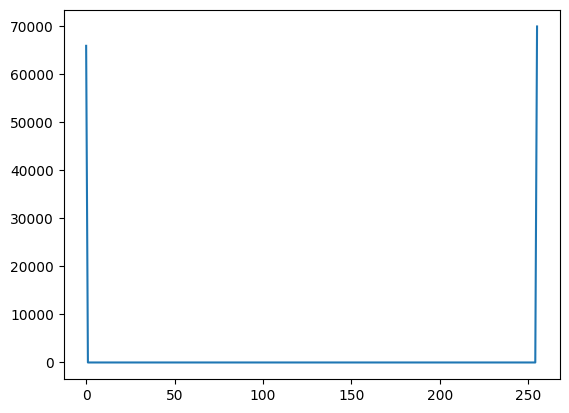

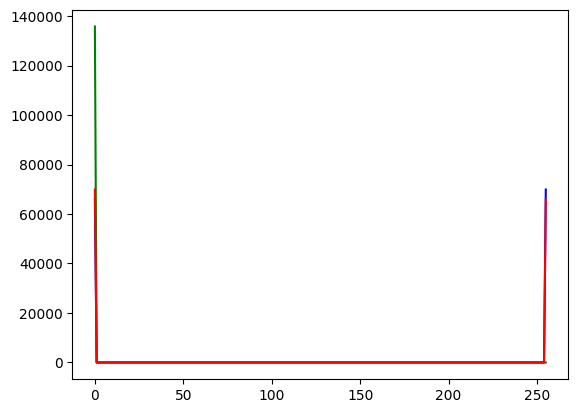

In [8]:
img_hist = cv2.calcHist([img],channels = [0],mask = None, histSize = [256], ranges = [0,256]) # channel = rgb mi grey mi ? , mask = resmin belirli bir kısmını alma
print(img_hist.shape)
plt.figure(),plt.plot(img_hist)

color = ("b", "g","r")
plt.figure()
for i, c in enumerate(color):
  hist = cv2.calcHist([img],channels = [i],mask = None, histSize = [256], ranges = [0,256])
  plt.plot(hist,color = c)

(2448, 3264, 3)


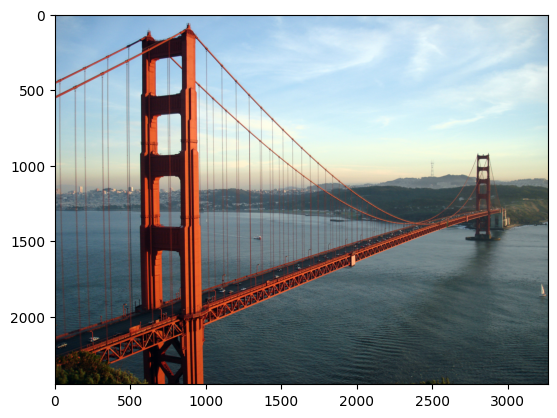

In [9]:
#
golden_gate = cv2.imread("/content/goldenGate.jpg")
golden_gate_vis = cv2.cvtColor(golden_gate, cv2.COLOR_BGR2RGB)
plt.figure(),plt.imshow(golden_gate_vis)
print(golden_gate.shape)

(<Figure size 640x480 with 1 Axes>,
 [<matplotlib.lines.Line2D at 0x7c5d03fe7be0>])

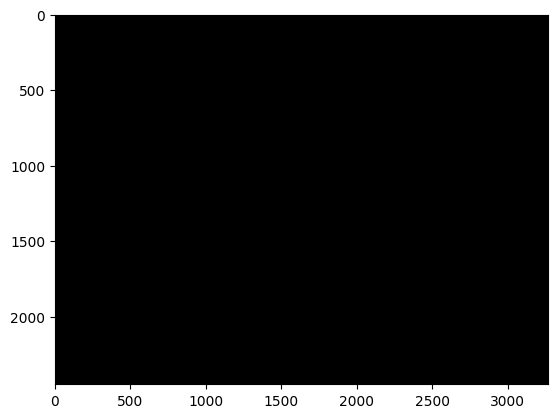

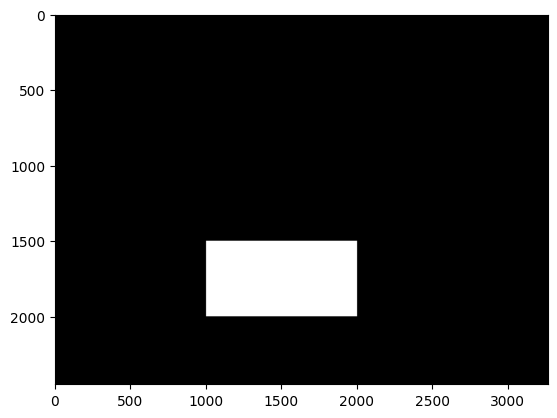

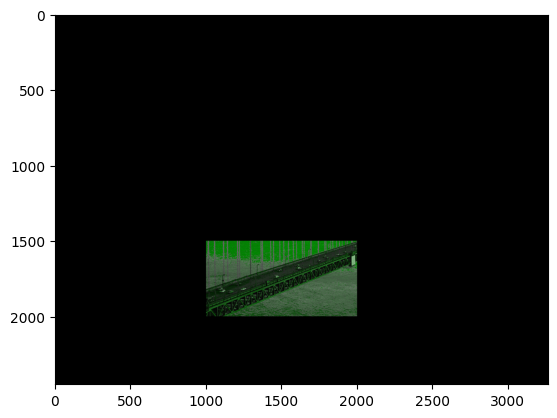

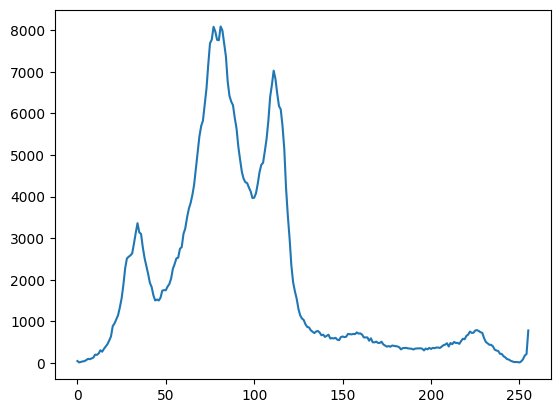

In [14]:
# mask
mask = np.zeros(golden_gate.shape[:2],np.uint8)
plt.figure(),plt.imshow(mask,cmap="gray")

mask[1500:2000, 1000:2000] = 255
plt.figure(), plt.imshow(mask,cmap="gray")

masked_img_vis = cv2.bitwise_and(golden_gate_vis, golden_gate, mask = mask)
plt.figure(), plt.imshow(masked_img_vis,cmap="gray")

masked_img = cv2.bitwise_and(golden_gate, golden_gate, mask = mask)
masked_img_hist = cv2.calcHist([golden_gate],channels = [i],mask = mask, histSize = [256], ranges = [0,256])
plt.figure(), plt.plot(masked_img_hist)

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7c5d0418f9d0>)

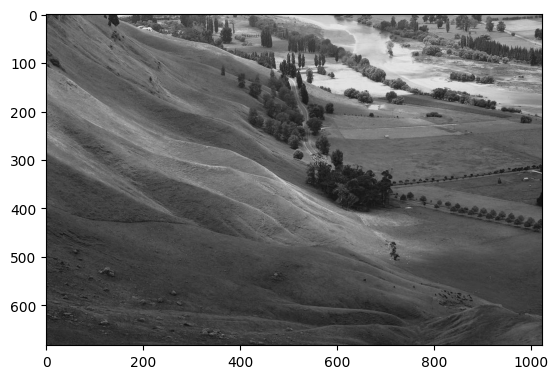

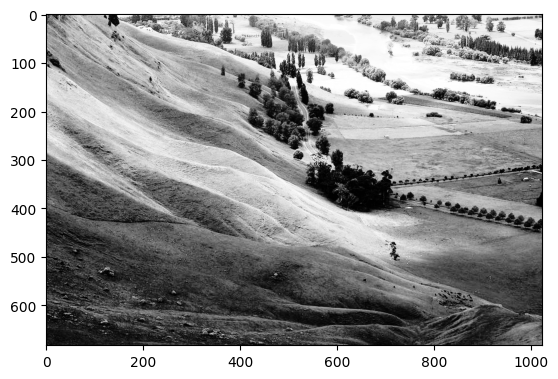

In [17]:
# Histogram Eşitleme = konstrastı arttırmayı sağlar ( karşıtlığı)
img = cv2.imread("/content/hist_equ.jpg",0)
plt.figure(),plt.imshow(img,cmap="gray")

img_hist = cv2.calcHist([img],channels = [0],mask = None, histSize = [256], ranges = [0,256])

eq_hist = cv2.equalizeHist(img)
plt.figure(),plt.imshow(eq_hist, cmap = "gray")